I mainly only use this notebook to generate and inspect mean maps before performing the cluster thresholding analyses, otherwise neglecting present code. To alter which data set is being analyzed, I alter what data is loaded into `maps`, plus target/source file paths until the final result of a thresholded TFCE image is computed.

In [1]:
## dependencies
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import os
import numpy as np
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.stats import pearsonr
from nilearn import image
from nilearn import plotting

## subject list
sub_list = ['0110171', '0110172', '0111171', '0112171', '0112172', '0112173',
            '0113171', '0115174', '0117171', '0118171', '0118172', '0119171',
            '0119172', '0119173', '0119174', '0120171', '0120172', '0120173',
            '0123171', '0123173', '0124171', '0125171', '0125172', '1121161',
            '1130161', '1202161', '1203161', '1206161', '1206162', '1206163',
            '1207162']

## root paths
curr_dir = os.getcwd()
SAVE_PATH = '/jukebox/ntb/projects/sketchloop02/data/searchlight_output'
proj_dir = '/mnt/bucket/people/jgunn'
data_dir = '/jukebox/ntb/projects/sketchloop02/data'
results_dir = os.path.join(proj_dir, 'csv')
nb_name = '1_recog_prepost_RSA.ipynb'
standard_reference_path = '/jukebox/ntb/projects/sketchloop02/searchlight_outputs/MNI152_T1_2mm_brain.nii.gz'

## add helpers to python path
import sys
if os.path.join(proj_dir, 'python') not in sys.path:
    sys.path.append(os.path.join(proj_dir, 'python'))

## module definitions
import analysis_helpers as helpers
#ROIs = ['V1','V2','LOC','IT','fusiform','parahippo','PRC','ento','hipp','mOFC',
#        'Frontal','Parietal','supraMarginal','Insula','postCentral','preCentral']
#ROIs_formatted = ["V1", "V2", "LOC", "IT", "fusiform", "para\nhippo",  "PRC",  "ento", "hipp", 'mOFC',
#                 'Frontal', 'Parietal', 'supra\nmarginal', 'Insula', 'post\nCentral', 'preCentral']
rois = ['V1','V2','LOC','IT','fusiform','parahippo','PRC','ento','hipp','mOFC']
roi_dir = os.path.join(data_dir, 'copes/roi')
cope_dir = os.path.join(data_dir, 'copes/recog/objectGLM')
sub_dirs = sorted(os.listdir(roi_dir))
helpers.roi_dir, helpers.cope_dir = roi_dir, cope_dir

/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


# Mean Pre-Post Clf Searchlight Map
Collect pre-post clf searchlight maps across subjects, take their mean, and save the result

## 34 or 56

In [21]:
## Collect pre-post rsa searchlight maps across subjects
maps = []
for sub in sub_list:
    maps.append(image.load_img(os.path.join(SAVE_PATH, sub+'_standard_prepostclf_56_searchlight.nii.gz')).get_data())
    mask = image.load_img(standard_reference_path).get_data()
    mask = mask.astype(bool)
    maps[-1][~mask] = np.nan

## take their mean
result = np.nanmean(maps, axis=0)

## save the result
affine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_prepostclf_56_searchlight.nii.gz')).affine
img = nib.Nifti1Image(result.astype(np.float32), affine)
nib.save(img, os.path.join(SAVE_PATH, 'mean_prepostclf_56_searchlight.nii.gz'))



/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.


/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


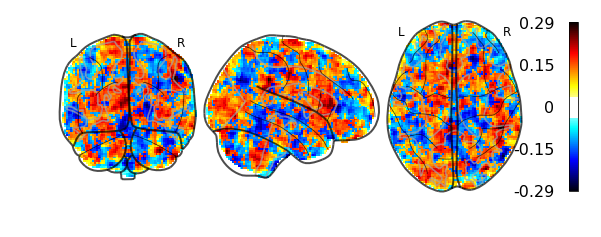

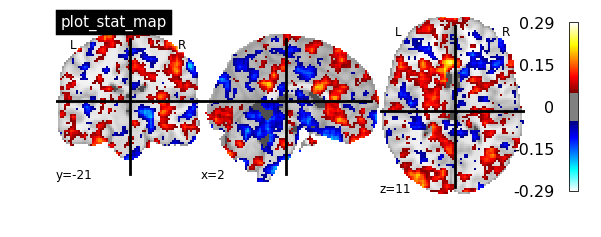

In [22]:
## plot the resulting mean map
localizer_tmap_filename = os.path.join(SAVE_PATH, 'mean_prepostclf_56_searchlight.nii.gz')
plotting.plot_glass_brain(localizer_tmap_filename, threshold=.04,
                        colorbar=True, plot_abs=False)
plotting.plot_stat_map(localizer_tmap_filename, cut_coords=(2, -21, 11), threshold=.05, 
                       title="plot_stat_map")
plt.show()

## 56-34

In [7]:
## Collect pre-post rsa searchlight maps across subjects
maps = []
for sub in sub_list:
    maps.append(image.load_img(os.path.join(SAVE_PATH, sub+'_standard_prepostclf_56_searchlight.nii.gz')).get_data()-
                image.load_img(os.path.join(SAVE_PATH, sub+'_standard_prepostclf_34_searchlight.nii.gz')).get_data())
    mask = image.load_img(standard_reference_path).get_data()
    mask = mask.astype(bool)
    maps[-1][~mask] = np.nan

## take their mean
result = np.nanmean(maps, axis=0)
print(np.nanmax(result))

## save the result
affine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_prepostclf_34_searchlight.nii.gz')).affine
img = nib.Nifti1Image(result.astype(np.float32), affine)
nib.save(img, os.path.join(SAVE_PATH, 'prepostclf_searchlight.nii.gz'))

0.04232089


/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()


/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


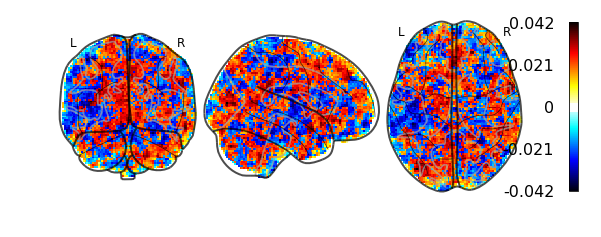

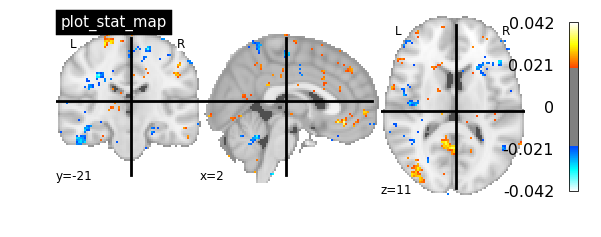

In [9]:
## plot the resulting mean map
localizer_tmap_filename = os.path.join(SAVE_PATH, 'prepostacc_searchlight.nii.gz')
plotting.plot_glass_brain(localizer_tmap_filename,
                        colorbar=True, plot_abs=False)
plotting.plot_stat_map(localizer_tmap_filename, cut_coords=(2, -21, 11), threshold=.02, 
                       title="plot_stat_map")
plt.show()

# Mean Pre-Post RSA Searchlight Map
Collect pre-post rsa searchlight maps across subjects, take their mean, and save the result

In [ ]:
## Collect pre-post rsa searchlight maps across subjects
maps = []
for sub in sub_list:
    maps.append(image.load_img(os.path.join(SAVE_PATH, sub+'_neurosketch_standard_prepost_searchlight.nii.gz')).get_data())
    mask = image.load_img(standard_reference_path).get_data()
    mask = mask.astype(bool)
    maps[-1][~mask] = np.nan

## take their mean
result = np.nanmean(maps, axis=0)

## save the result
affine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_neurosketch_standard_prepost_searchlight.nii.gz')).affine
img = nib.Nifti1Image(result.astype(np.float32), affine)
nib.save(img, os.path.join(SAVE_PATH, 'mean_prepost_searchlight.nii.gz'))



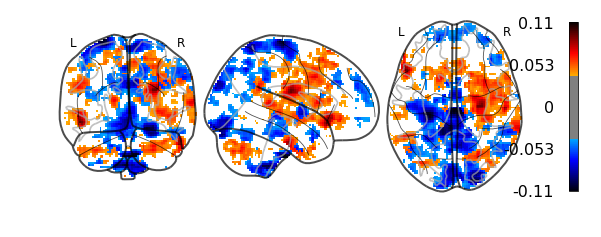

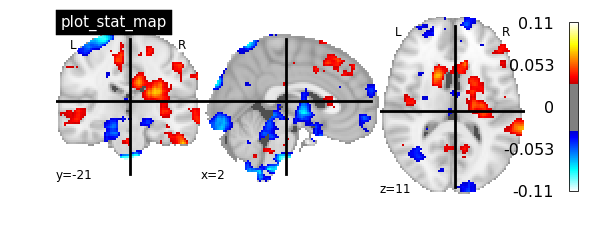

In [17]:
## plot the resulting mean map
localizer_tmap_filename = os.path.join(SAVE_PATH, 'mean_prepost_searchlight.nii.gz')
plotting.plot_glass_brain(localizer_tmap_filename, threshold=.04,
                        colorbar=True, plot_abs=False)
plotting.plot_stat_map(localizer_tmap_filename, cut_coords=(2, -21, 11), threshold=.03, 
                       title="plot_stat_map")
plt.show()

# Mean Target Selectivity Searchlight Map
Collect target selectivity searchlight maps across subjects, take their mean, save and plot the result

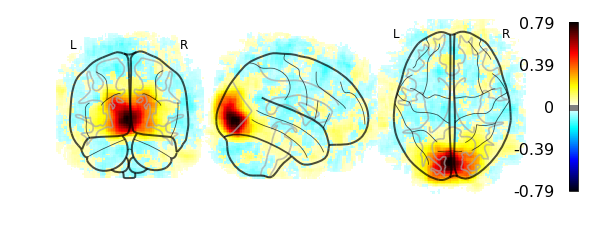

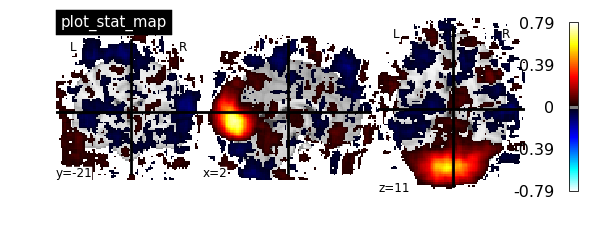

In [20]:
## collect target selectivity searchlight maps across subjects
maps = [image.load_img(os.path.join(SAVE_PATH, s+'_standard_clf_searchlight.nii.gz')).get_data() for s in sub_list]

## take their mean
result = np.nanmean(maps, axis=0)

## save result
affine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_clf_searchlight.nii.gz')).affine
img = nib.Nifti1Image(result.astype(np.float32), affine)
nib.save(img, os.path.join(SAVE_PATH, 'mean_clf_searchlight.nii.gz'))

# plot result
localizer_tmap_filename = os.path.join(SAVE_PATH, 'mean_clf_searchlight.nii.gz')
plotting.plot_glass_brain(localizer_tmap_filename, #threshold=.03,
                        colorbar=True, plot_abs=False)
plotting.plot_stat_map(localizer_tmap_filename, cut_coords=(2, -21, 11), threshold=.02, 
                       title="plot_stat_map")
plt.show()

# Subject by Subject Correlation Map
Collect target selectivity and prepost rsa searchlight maps across subjects, take subjectwise correlation between target selectivity and prepost rsa values for each voxel

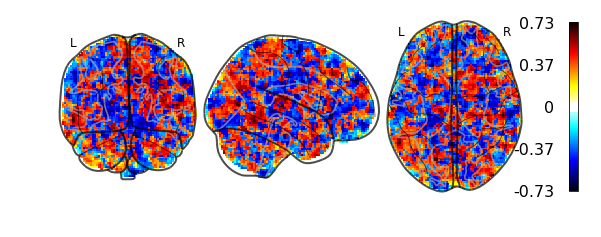

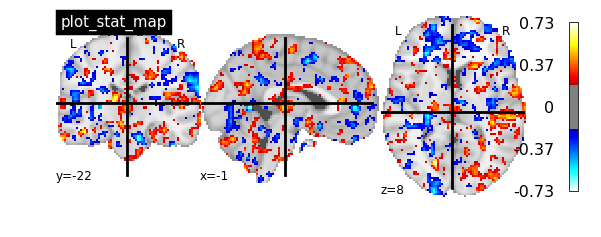

In [18]:
## collect target selectivity maps
clfmaps = [image.load_img(os.path.join(SAVE_PATH, s+'_standard_clf_searchlight.nii.gz')).get_data() for s in sub_list]
clfaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_clf_searchlight.nii.gz')).affine

## collect prepost rsa maps
prepostmaps = []
for sub in sub_list:
    prepostmaps.append(image.load_img(os.path.join(SAVE_PATH, sub+'_standard_prepostclf_searchlight.nii.gz')).get_data())
    mask = image.load_img(standard_reference_path).get_data()
    mask = mask.astype(bool)
    prepostmaps[-1][~mask] = np.nan
prepostaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_prepostclf_searchlight.nii.gz')).affine

# initialize empty map
result = np.zeros((np.shape(clfmaps)[1:]))

## take subjectwise correlation between target selectivity and prepost rsa values for each voxel
for x in range(len(clfmaps[0])):
    for y in range(len(clfmaps[0][0])):
        for z in range(len(clfmaps[0][0][0])):
            clfvector = np.array([clfmaps[i][x, y, z] for i in range(len(clfmaps))])
            prepostvector = np.array([prepostmaps[i][x, y, z] for i in range(len(prepostmaps))])
            result[x, y, z] = pearsonr(clfvector, prepostvector)[0]

# save result
img = nib.Nifti1Image(result.astype(np.float32), clfaffine)
nib.save(img, os.path.join(SAVE_PATH, 'clfcor_searchlight.nii.gz'))

# display result
localizer_tmap_filename = os.path.join(SAVE_PATH, 'clfcor_searchlight.nii.gz')
plotting.plot_glass_brain(localizer_tmap_filename, plot_abs=False, colorbar=True)
plotting.plot_stat_map(localizer_tmap_filename,
                       threshold=.2, title="plot_stat_map")
plt.show()

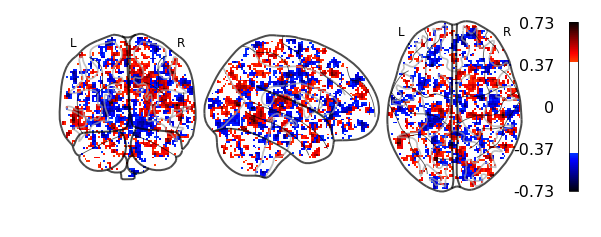

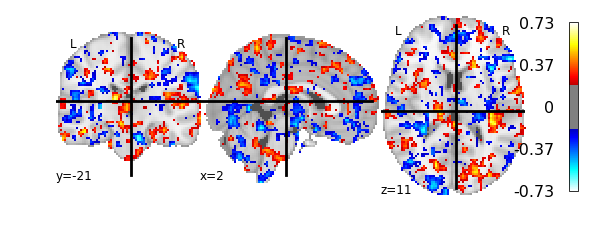

In [19]:
# display result
localizer_tmap_filename = os.path.join(SAVE_PATH, 'clfcor_searchlight.nii.gz')
plotting.plot_glass_brain(localizer_tmap_filename, threshold=.4,
                        colorbar=True, plot_abs=False)
plotting.plot_stat_map(localizer_tmap_filename, cut_coords=(2, -21, 11), threshold=.2, 
                       )
plt.show()

## CLFs

In [ ]:
## collect target selectivity maps
clfmaps = [image.load_img(os.path.join(SAVE_PATH, s+'_standard_clf_searchlight.nii.gz')).get_data() for s in sub_list]
clfaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_clf_searchlight.nii.gz')).affine

## collect prepost rsa maps
prepostmaps = []
for sub in sub_list:
    prepostmaps.append(image.load_img(os.path.join(SAVE_PATH, sub+'_standard_prepostclf_56_searchlight.nii.gz')).get_data()-
                       image.load_img(os.path.join(SAVE_PATH, sub+'_standard_prepostclf_34_searchlight.nii.gz')).get_data())
    mask = image.load_img(standard_reference_path).get_data()
    mask = mask.astype(bool)
    prepostmaps[-1][~mask] = np.nan
prepostaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_prepostclf_56_searchlight.nii.gz')).affine

# initialize empty map
result = np.zeros((np.shape(clfmaps)[1:]))

## take subjectwise correlation between target selectivity and prepost rsa values for each voxel
for x in range(len(clfmaps[0])):
    for y in range(len(clfmaps[0][0])):
        for z in range(len(clfmaps[0][0][0])):
            clfvector = np.array([clfmaps[i][x, y, z] for i in range(len(clfmaps))])
            prepostvector = np.array([prepostmaps[i][x, y, z] for i in range(len(prepostmaps))])
            result[x, y, z] = pearsonr(clfvector, prepostvector)[0]

# save result
img = nib.Nifti1Image(result.astype(np.float32), clfaffine)
nib.save(img, os.path.join(SAVE_PATH, 'clfcor_searchlight.nii.gz'))

/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


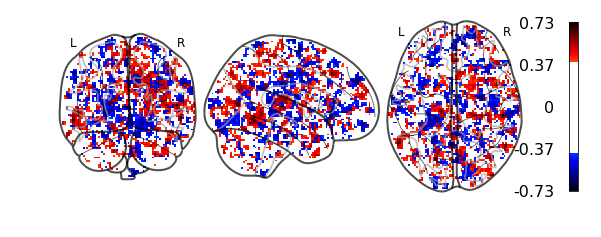

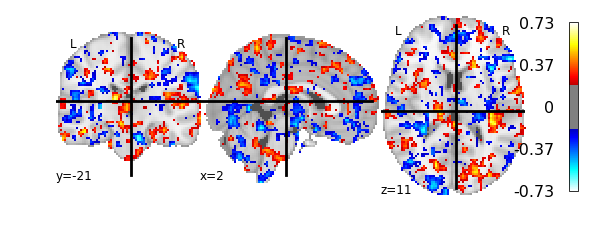

In [12]:
# display result
localizer_tmap_filename = os.path.join(SAVE_PATH, 'clfcor_searchlight.nii.gz')
plotting.plot_glass_brain(localizer_tmap_filename, threshold=.4,
                        colorbar=True, plot_abs=False)
plotting.plot_stat_map(localizer_tmap_filename, cut_coords=(2, -21, 11), threshold=.2, 
                       )
plt.show()

## Followup: How does this map look after TFCE?

/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/site-packages/nilearn/plotting/displays.py:684: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))
/usr/people/jgunn/.conda/envs/jgunn/lib/python3.6/site-packages/nilearn/plotting/displays.py:684: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


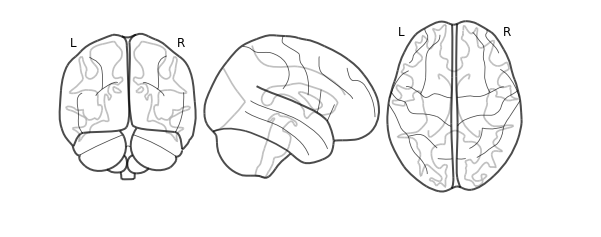

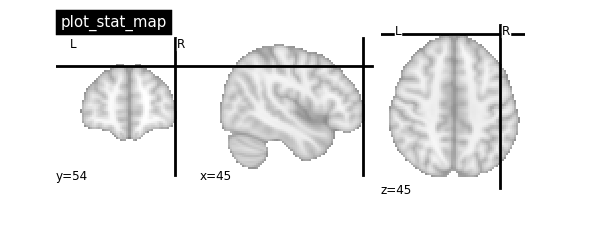

In [7]:
#!module load fsl; flirt -in "$flirtin" -out "$flirtout" -ref "$flirtref" -applyxfm -init "$flirtinit"

localizer_tmap_filename = os.path.join(SAVE_PATH, 'cor_searchlight.nii.gz')
tfceout = os.path.join(SAVE_PATH, 'tfcecor_searchlight.nii.gz')
!module load fsl; fslmaths "$localizer_tmap_filename" -tfce 2 0.5 6 "$tfceout"
plotting.plot_glass_brain(tfceout, plot_abs=False, colorbar=True)
plotting.plot_stat_map(tfceout,
                       threshold=.2, title="plot_stat_map")
plt.show()

In [9]:
!pip install --upgrade pip

    100% |████████████████████████████████| 1.3MB 1.1MB/s 
  Found existing installation: pip 10.0.1
    Uninstalling pip-10.0.1:
      Successfully uninstalled pip-10.0.1


## Followup: What's The Average Correlation of Searchlight Scores in Each ROI?
convert each image into standard space, generate upper and lower bounds for bootstrap CI, then plot

In [5]:
## convert each image into standard space
for roi in rois:
    for sub in sub_dirs:
        if roi in ['Frontal', 'Parietal', 'supraMarginal', 'Insula', 'postCentral', 'preCentral']:
            flirtin = os.path.join(roi_dir, sub, roi + '_draw.nii.gz')
        elif roi in ['V1', 'V2']:
            flirtin = os.path.join(roi_dir, sub, roi+'.nii.gz')
        else:
            flirtin = os.path.join(roi_dir, sub, roi + '_FS.nii.gz')
        
        flirtout = os.path.join(SAVE_PATH, sub+'_'+roi+'_standard.nii.gz')
        flirtref = standard_reference_path
        flirtinit = '/jukebox/ntb/users/jwammes/sketchloop/subjects/' + sub + '/analysis/firstlevel/draw_run_1.feat/reg/highres2standard.mat'
        !module load fsl; flirt -in "$flirtin" -out "$flirtout" -ref "$flirtref" -applyxfm -init "$flirtinit"

### We wanna generate a bootstrapped confidence interval for each ROI. Idea is that for each sampling of subjects, you generate the whole correlation map and then from these do the ROI stuff. Wait, are ROIs the same size through each subject? It doesn't matter.

In [7]:
def cor_analysis(subs, roi):
    ## collect roi mask 
    maskpath= os.path.join(SAVE_PATH, '1207162_neurosketch_'+roi+'_standard.nii.gz')
    mask=image.load_img(maskpath).get_data()
    
    ## collect target selectivity maps
    #clfmaps = [image.load_img(os.path.join(SAVE_PATH, s+'_standard_clf_searchlight.nii.gz')).get_data() for s in subs]
    #clfaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_clf_searchlight.nii.gz')).affine

    ## collect prepost rsa maps
    prepostmaps = []
    for sub in subs:
        prepostmaps.append(image.load_img(os.path.join(SAVE_PATH, sub+'_neurosketch_standard_prepost_searchlight.nii.gz')).get_data())
        #mask = image.load_img(standard_reference_path).get_data()
        mask = mask.astype(bool)
        prepostmaps[-1][~mask] = np.nan
    prepostaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_neurosketch_standard_prepost_searchlight.nii.gz')).affine

    # initialize empty map
    result = np.zeros((np.shape(prepostmaps)[1:]))

    ## take subjectwise correlation between target selectivity and prepost rsa values for each voxel
    for x in range(len(prepostmaps[0])):
        for y in range(len(prepostmaps[0][0])):
            for z in range(len(prepostmaps[0][0][0])):
                #clfvector = np.array([clfmaps[i][x, y, z] for i in range(len(clfmaps))])
                prepostvector = np.array([prepostmaps[i][x, y, z] for i in range(len(prepostmaps))])
                result[x, y, z] =  np.mean(prepostvector) #pearsonr(clfvector, prepostvector)[0]
                
    return np.nanmean(result[mask==1])

for roi in rois:
    print(roi)
    print(cor_analysis(np.array(sub_list), roi))

V1
-0.017017776162637565
V2
-0.01445390880150954
LOC
-0.008169404889376732
IT
0.006337656689847328
fusiform
0.0009402217714681731
parahippo
-0.00476433127524544
PRC
0.0011380565882460004
ento
0.0021490155374402657
hipp
0.0026127568549719985
mOFC
-0.005655447691649784


In [35]:
def findborders(roi):
    ## collect roi mask 
    maskpath= os.path.join(SAVE_PATH, '1207162_neurosketch_'+roi+'_standard.nii.gz')
    mask=image.load_img(maskpath).get_data() != 0

    result = np.zeros(np.shape(mask))
    for x in range(np.shape(mask)[0]):
        for y in range(np.shape(mask)[1]):
            for z in range(np.shape(mask)[2]):
                if np.any(0 == mask[x-1:x+2, y-1:y+2, z-1:z+2]) and not np.all(0 == mask[x-1:x+2, y-1:y+2, z-1:z+2]):
                    result[x, y, z] = 1
    return mask, result

roi = 'V1'
mask, result = findborders(roi)
maskpath= os.path.join(SAVE_PATH, '1207162_neurosketch_'+roi+'_standard.nii.gz')
affine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_neurosketch_standard_prepost_searchlight.nii.gz')).affine
nib.save(nib.Nifti1Image(result.astype(np.float32), affine), 'test.nii.gz')

In [38]:
rois

['V1',
 'V2',
 'LOC',
 'IT',
 'fusiform',
 'parahippo',
 'PRC',
 'ento',
 'hipp',
 'mOFC']

In [ ]:
def cor_analysis(subs, roi):
    ## collect roi mask 
    maskpath= os.path.join(SAVE_PATH, '1207162_neurosketch_'+roi+'_standard.nii.gz')
    mask=image.load_img(maskpath).get_data()
    
    ## collect target selectivity maps
    clfmaps = [image.load_img(os.path.join(SAVE_PATH, s+'_standard_clf_searchlight.nii.gz')).get_data() for s in subs]
    clfaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_standard_clf_searchlight.nii.gz')).affine

    ## collect prepost rsa maps
    prepostmaps = []
    for sub in subs:
        prepostmaps.append(image.load_img(os.path.join(SAVE_PATH, sub+'_neurosketch_standard_prepost_searchlight.nii.gz')).get_data())
        mask = image.load_img(standard_reference_path).get_data()
        mask = mask.astype(bool)
        prepostmaps[-1][~mask] = np.nan
    prepostaffine = image.load_img(os.path.join(SAVE_PATH, sub_list[0]+'_neurosketch_standard_prepost_searchlight.nii.gz')).affine

    # initialize empty map
    result = np.zeros((np.shape(clfmaps)[1:]))

    ## take subjectwise correlation between target selectivity and prepost rsa values for each voxel
    for x in range(len(clfmaps[0])):
        for y in range(len(clfmaps[0][0])):
            for z in range(len(clfmaps[0][0][0])):
                clfvector = np.array([clfmaps[i][x, y, z] for i in range(len(clfmaps))])
                prepostvector = np.array([prepostmaps[i][x, y, z] for i in range(len(prepostmaps))])
                result[x, y, z] = pearsonr(clfvector, prepostvector)[0]
                
    return np.nanmean(result[mask==1])

upperbounds = []
lowerbounds = []
for roi in rois:
    result = helpers.custom_bootstrapCI(np.array(sub_list), cor_analysis, 100, 'V1')
    lowerbounds.append(result[1])
    upperbounds.append(result[2])

In [ ]:
imagepath = os.path.join(SAVE_PATH, 'cor_searchlight.nii.gz')
corimage = image.load_img(imagepath).get_data()

means = []
for roi in rois:
    maskpath= os.path.join(SAVE_PATH, '1207162_neurosketch_'+roi+'_standard.nii.gz')
    mask=image.load_img(maskpath).get_data()
    means.append(np.nanmean(corimage[mask==1]))

fig, ax = plt.subplots(figsize=(17,6))
rects1 = ax.bar(rois, means, .7, color='r')
for i in range(len(rois)):
    plt.vlines(i, lowerbounds[i], upperbounds[i])

ax.set_ylabel('Mean Correlation in ROI')
ax.set_title('Mean Correlation in Each ROI')
plt.show()

## Arbitrary Visualizations

### Standard Space ROI Demo

In [ ]:
## let's plot an example ROI for a couple of subjects
testroi = 'mOFC'
print(testroi)

for s in sub_dirs[:2]:
    print(s)
    localizer_tmap_filename = os.path.join(SAVE_PATH, s+'_'+testroi+'_standard.nii.gz')
    plotting.plot_stat_map(localizer_tmap_filename,threshold='auto', title="plot_stat_map")
    plt.show()

### Subject by Subject Target Selectivity Map

0110171


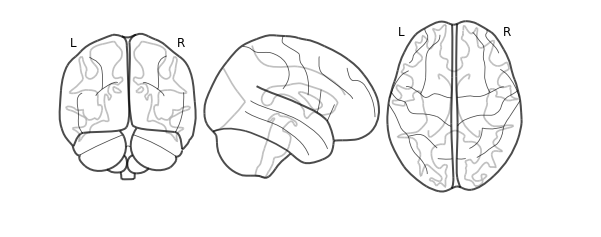

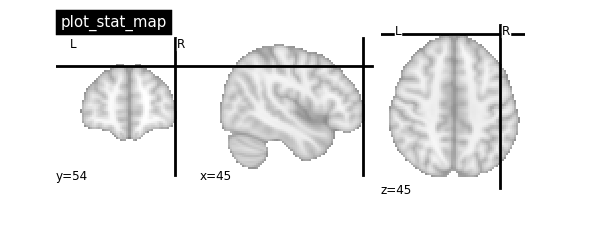

0110172


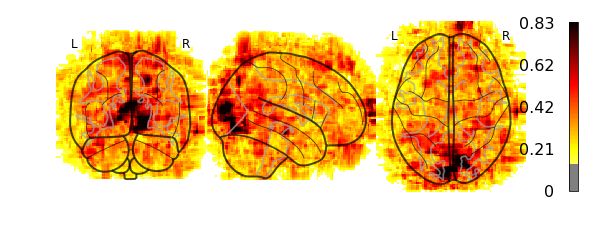

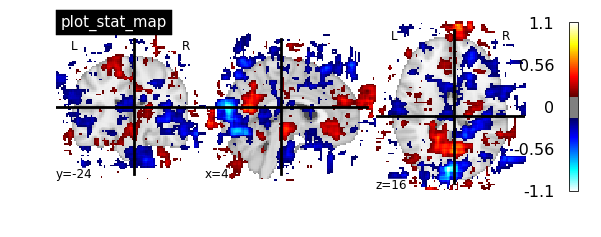

0111171


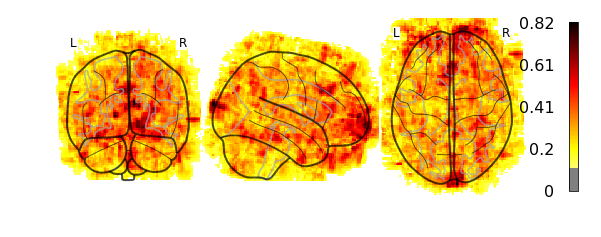

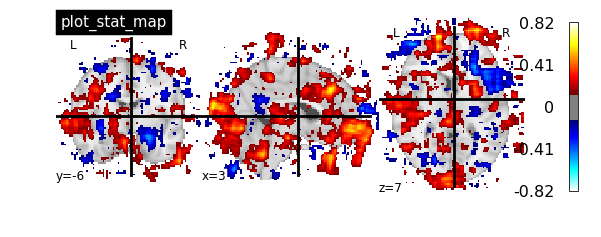

0112171


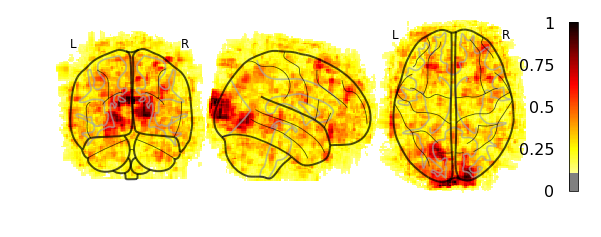

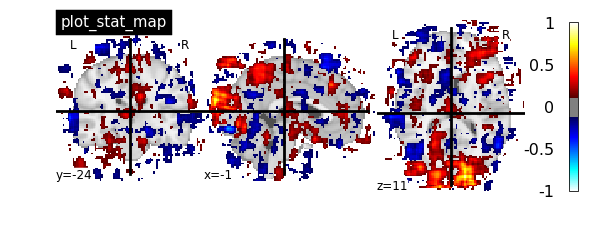

0112172


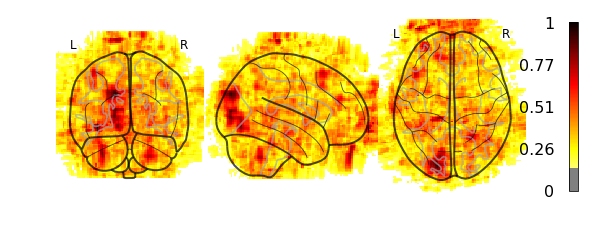

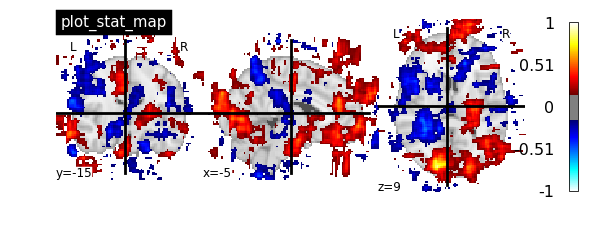

0112173


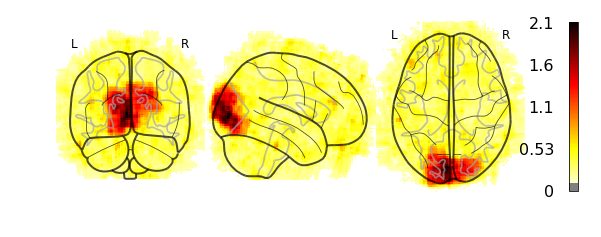

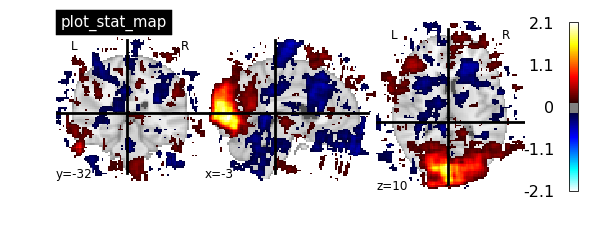

0113171


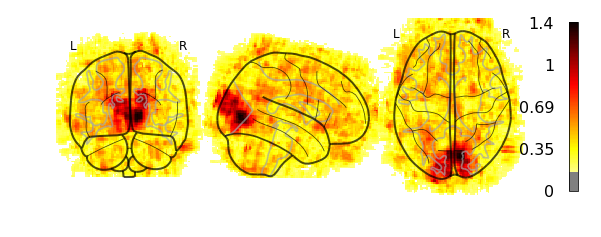

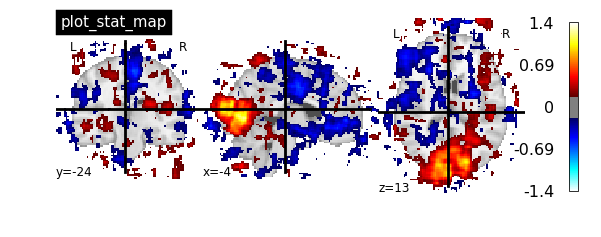

0115174


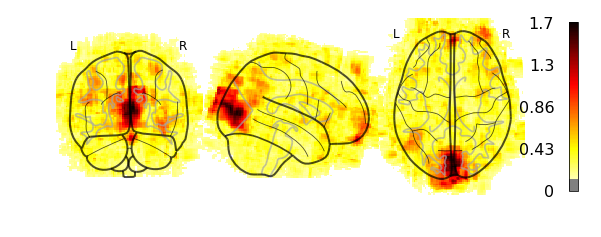

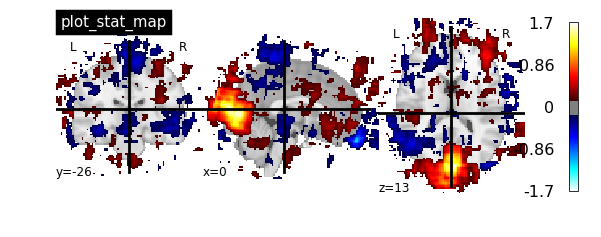

0117171


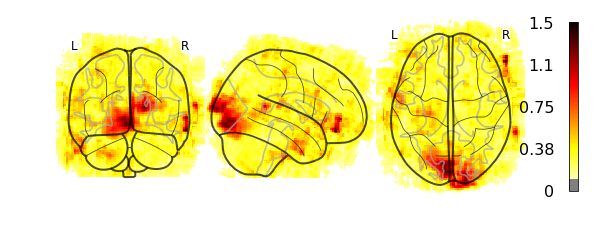

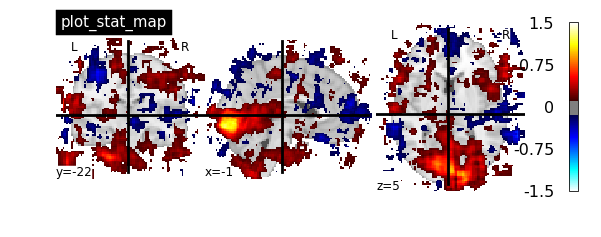

0118171


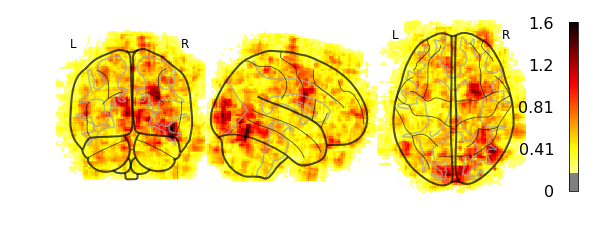

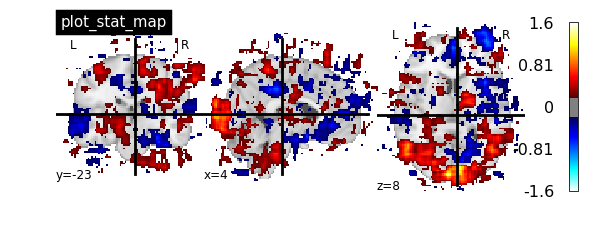

0118172


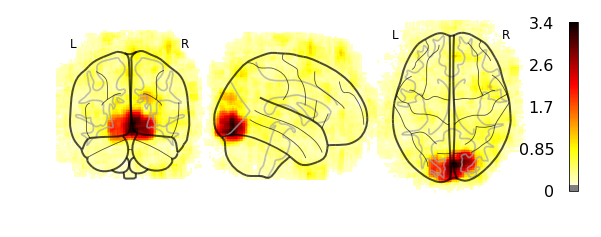

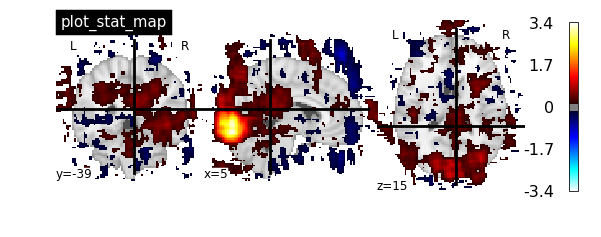

0119171


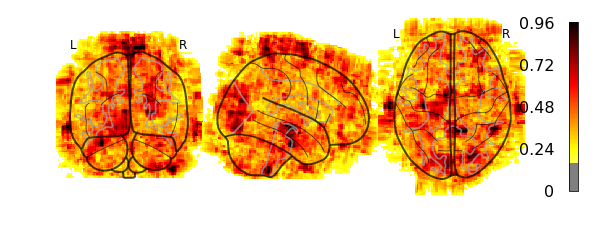

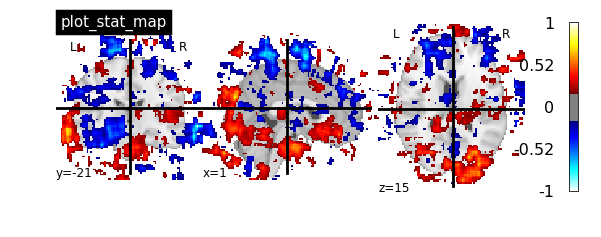

0119172


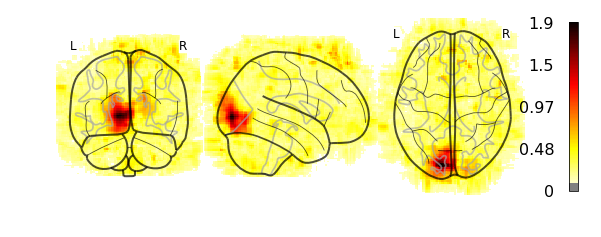

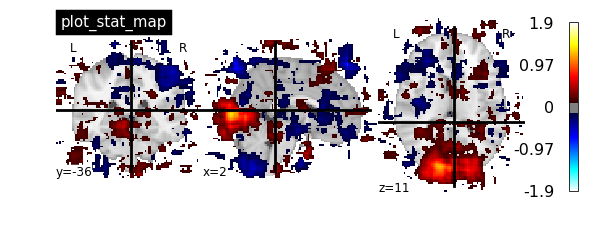

0119173


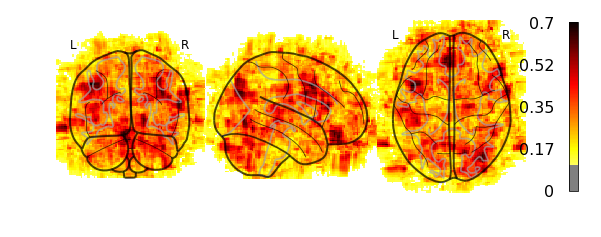

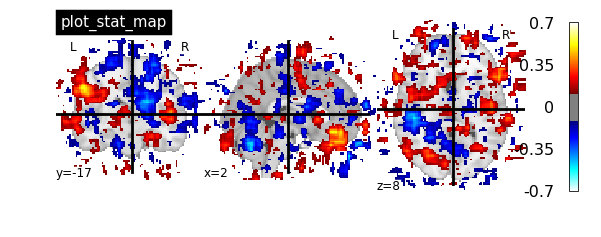

0119174


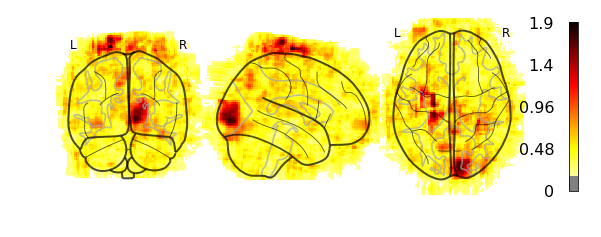

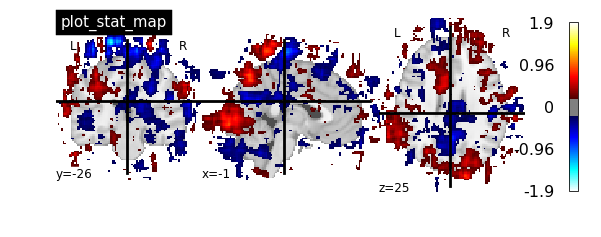

0120171


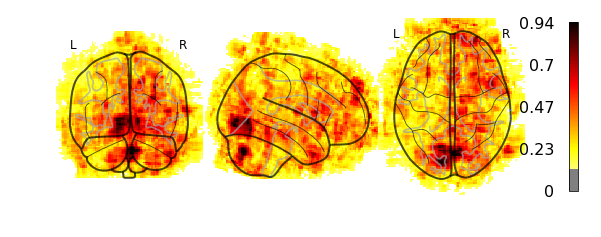

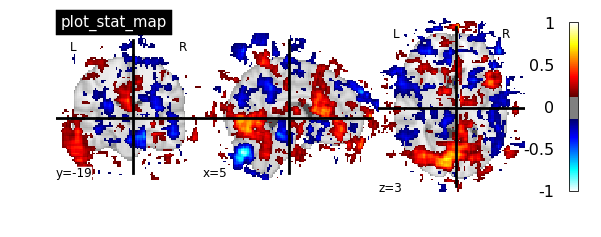

0120172


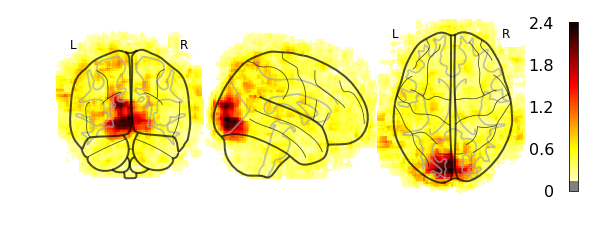

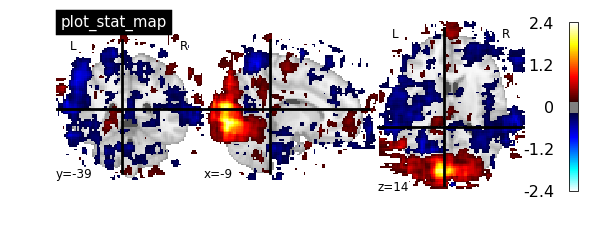

0120173


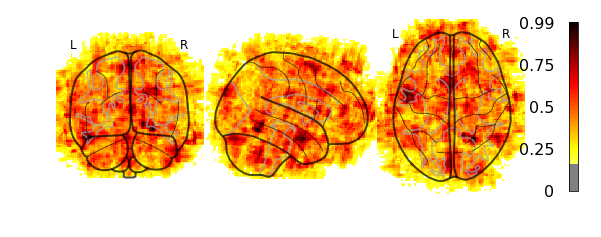

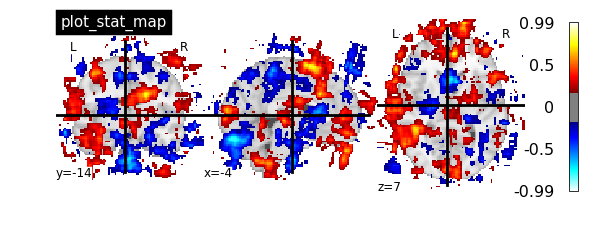

0123171


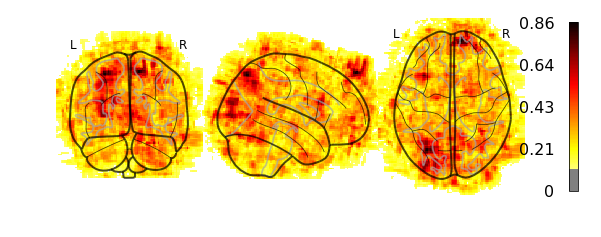

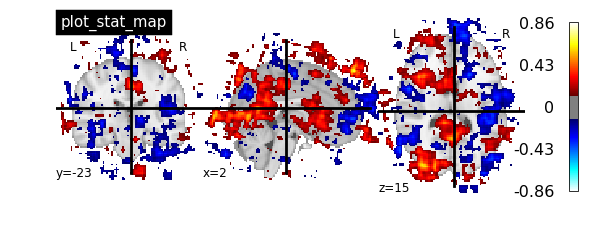

0123173


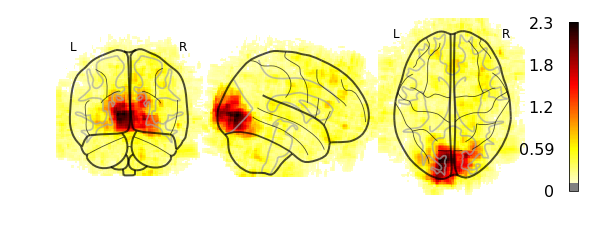

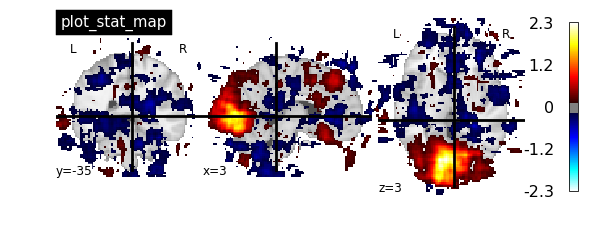

0124171


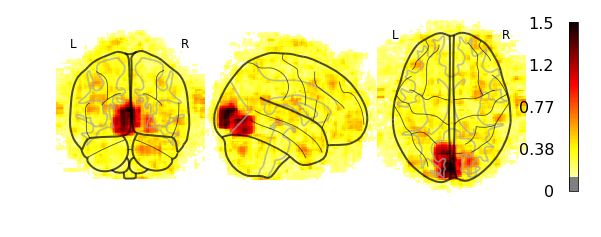

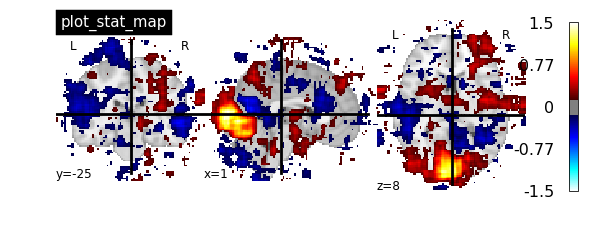

0125171


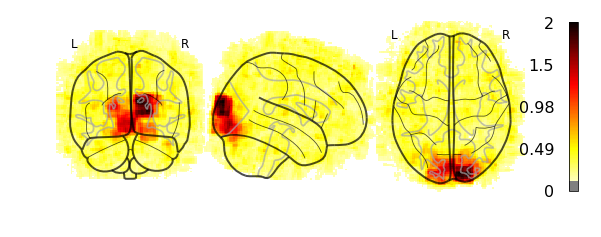

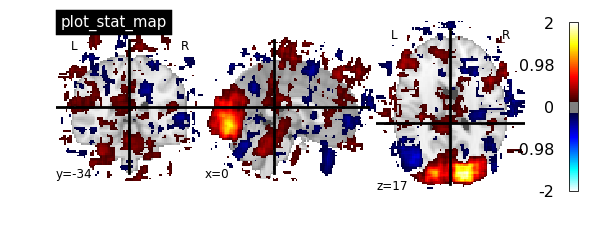

0125172


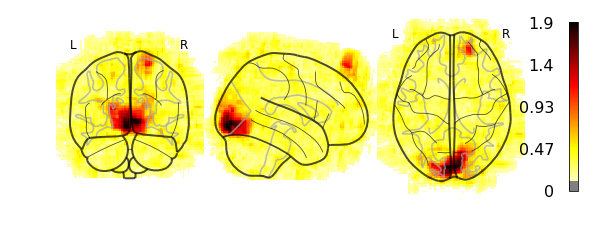

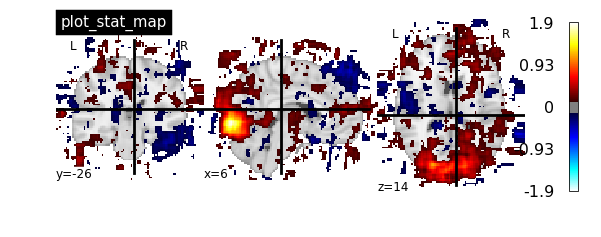

1121161


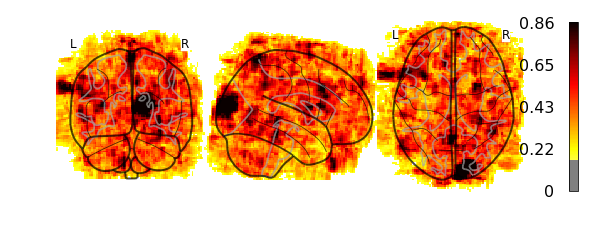

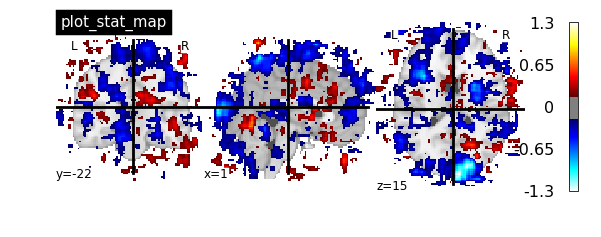

1130161


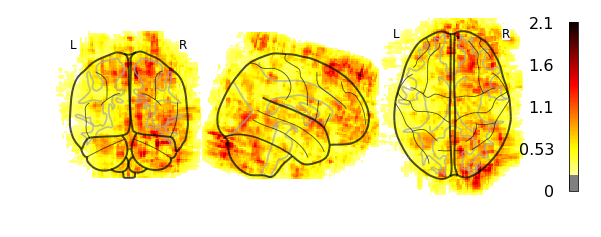

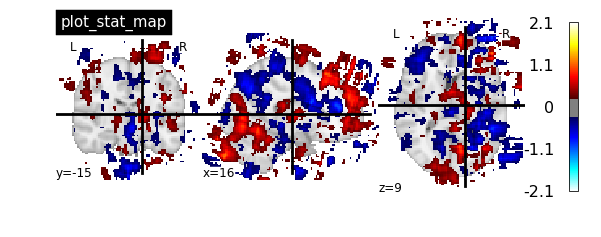

1202161


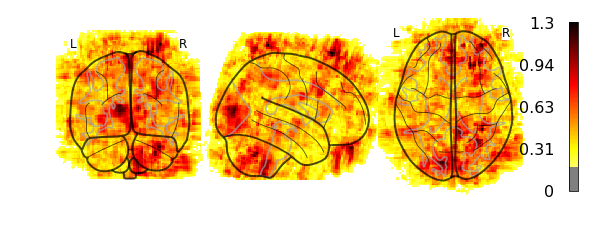

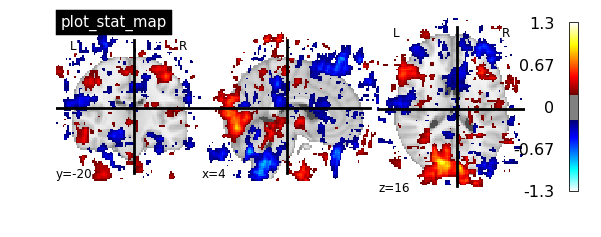

1203161


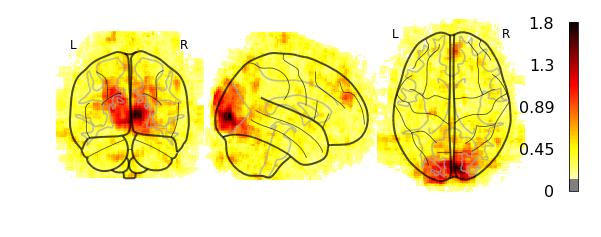

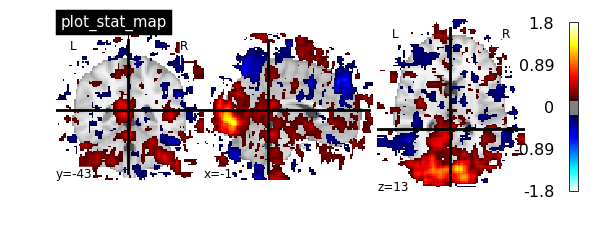

1206161


KeyboardInterrupt: 

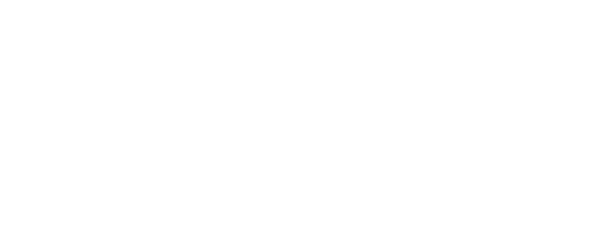

In [19]:
import os
from nilearn import plotting

for sub in sub_list:
    print(sub)
    localizer_tmap_filename = os.path.join(SAVE_PATH, sub+'_standard_clf_searchlight.nii.gz')
    plotting.plot_glass_brain(localizer_tmap_filename, #bg_img=None,#bg_img='/jukebox/ntb/projects/sketchloop02/searchlight_outputs/MNI152_T1_2mm_brain.nii.gz',
                            threshold='auto', colorbar=True)
    plotting.plot_stat_map(localizer_tmap_filename, #bg, , _img=None, #bg_img='/jukebox/ntb/projects/sketchloop02/searchlight_outputs/MNI152_T1_2mm_brain.nii.gz',
                           threshold='auto', title="plot_stat_map")
    plt.show()

### Subject by Subject Prepost RSA Map

0110171


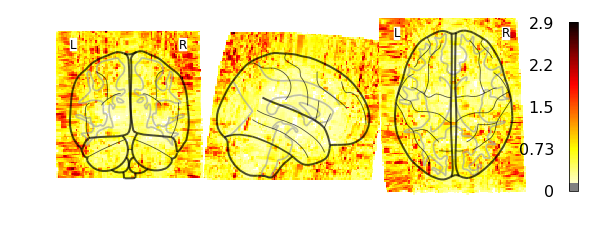

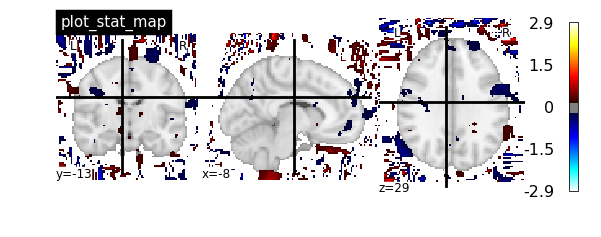

0110172


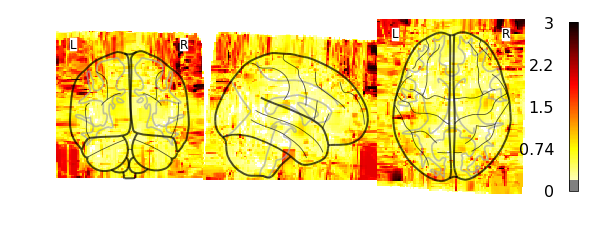

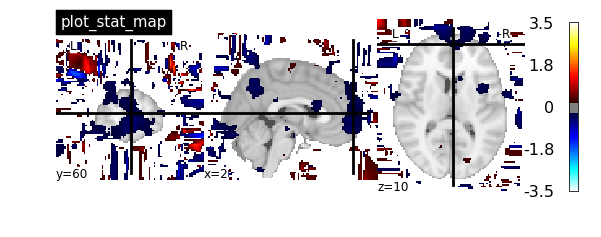

0111171


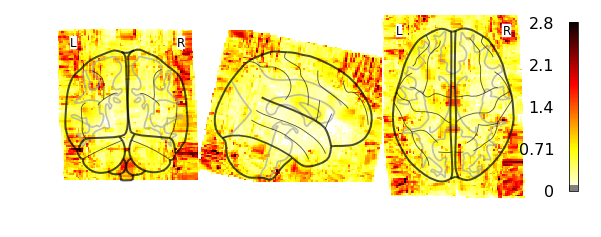

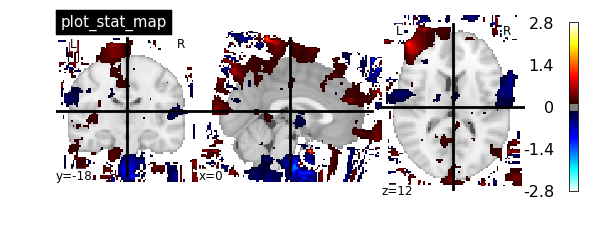

0112171


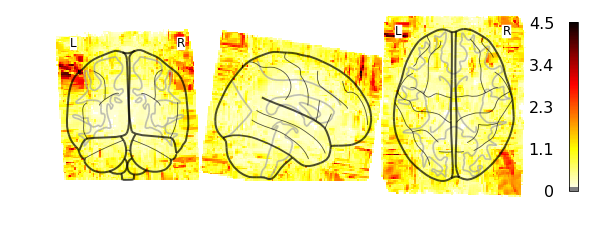

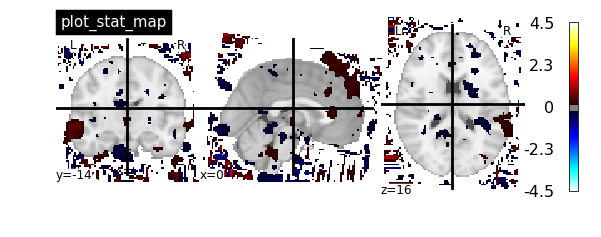

0112172


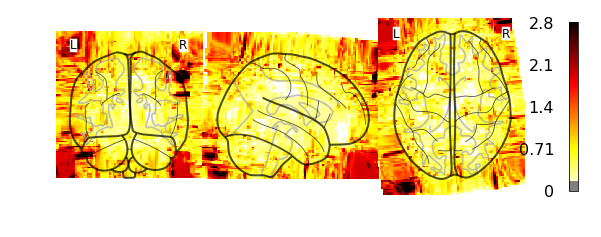

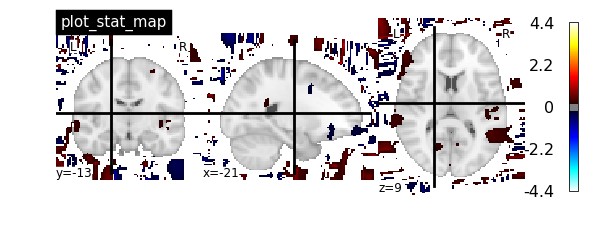

0112173


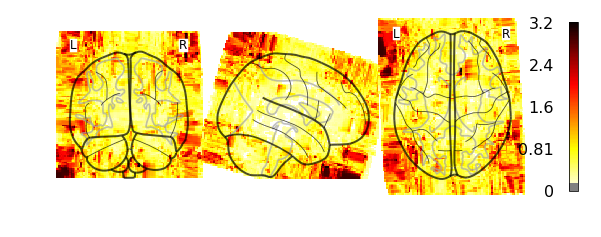

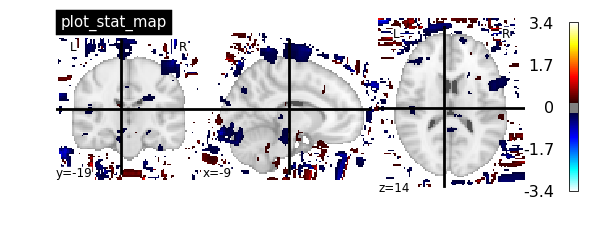

0113171


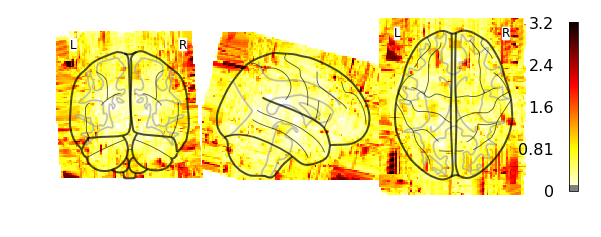

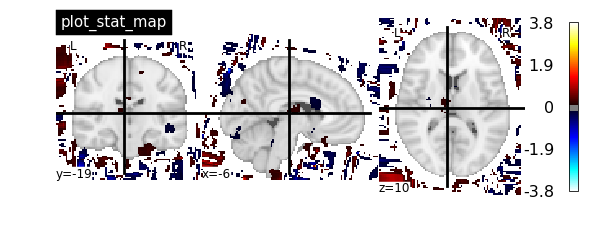

0115174


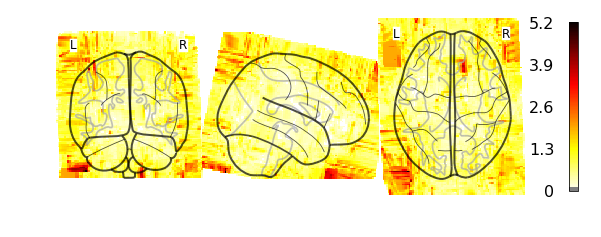

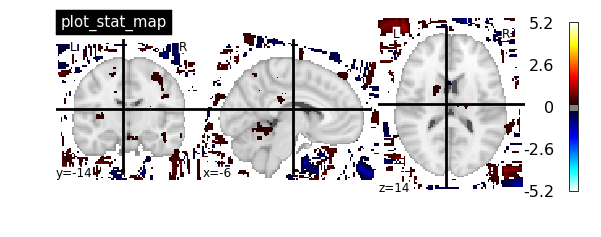

0117171


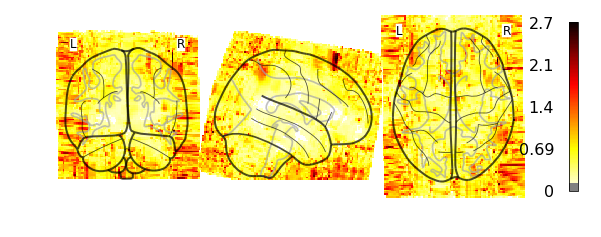

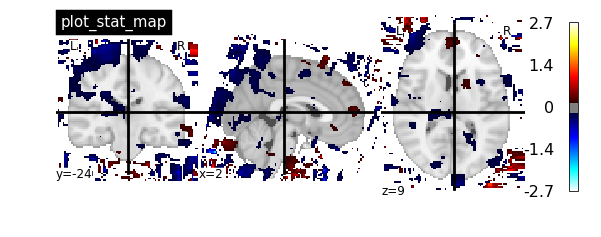

0118171


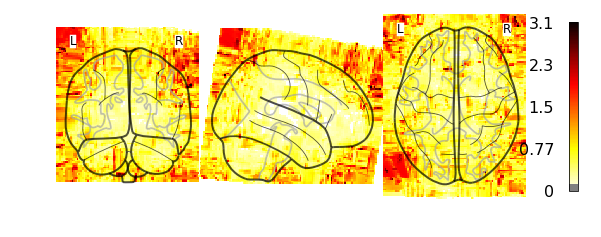

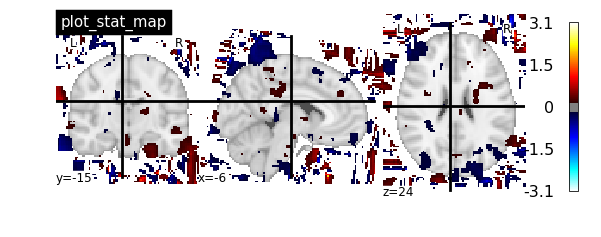

0118172


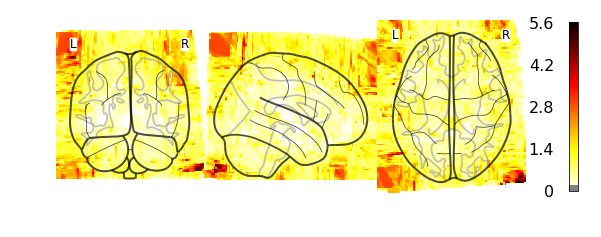

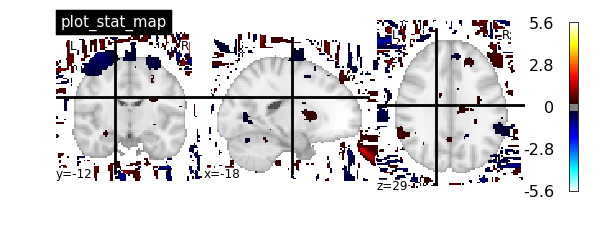

0119171


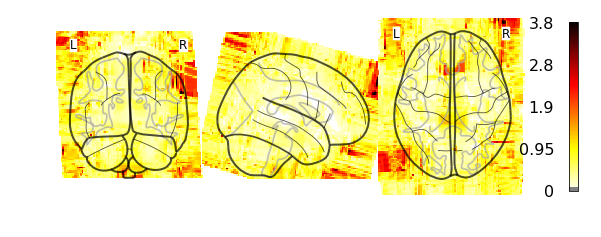

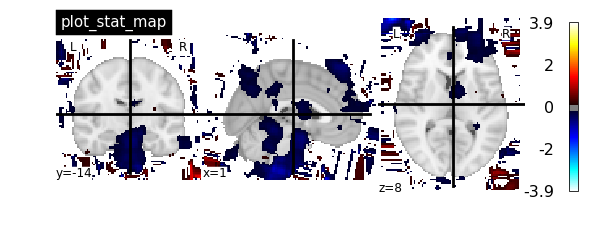

0119172


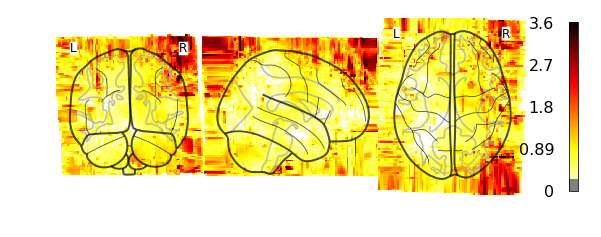

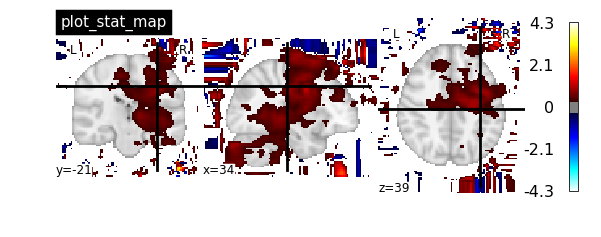

0119173


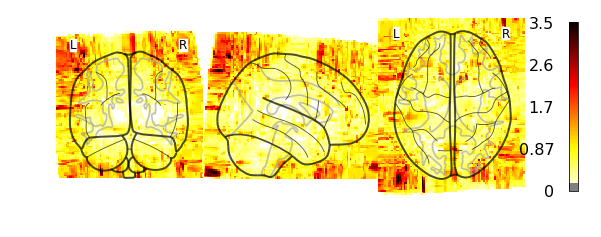

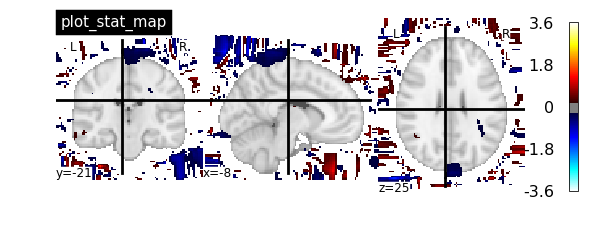

0119174


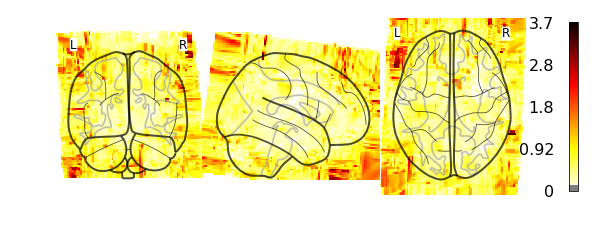

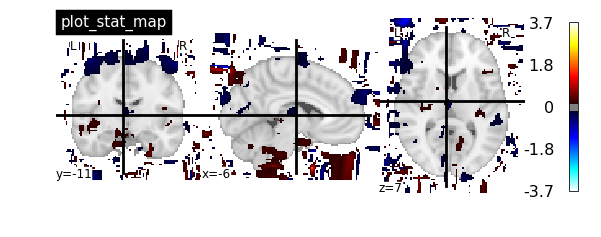

0120171


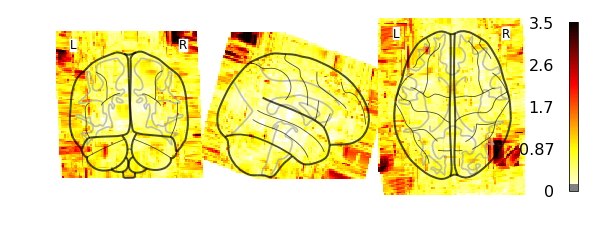

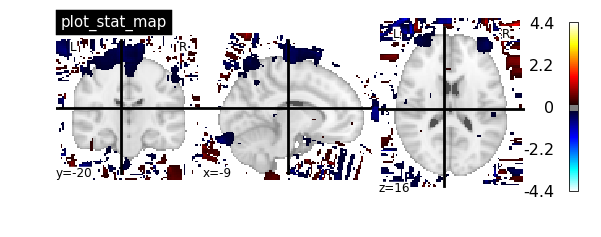

0120172


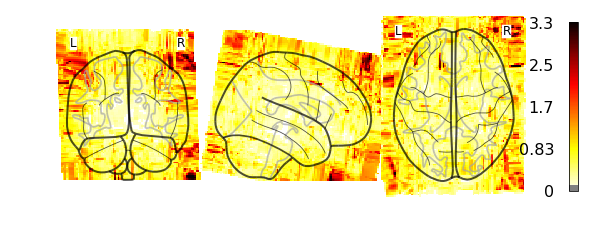

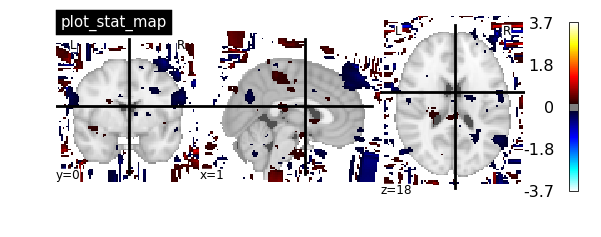

0120173


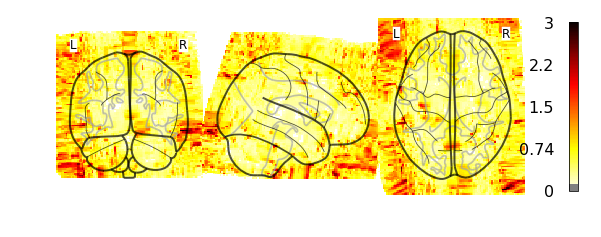

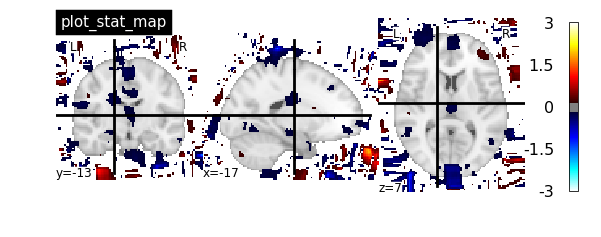

0123171


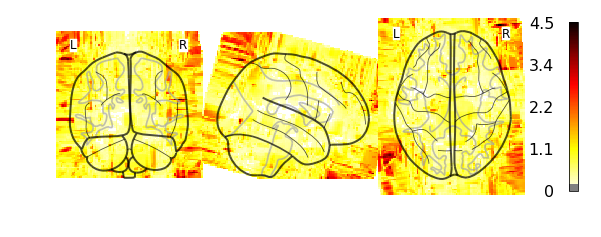

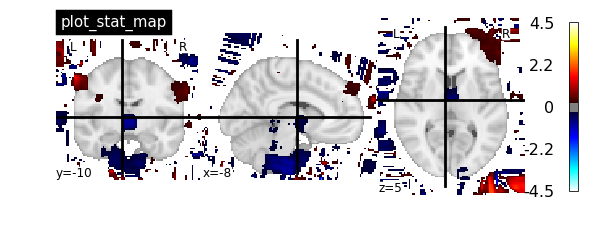

0123173


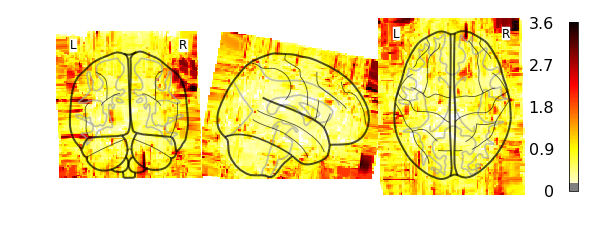

KeyboardInterrupt: 

In [18]:
import os
from nilearn import plotting

for sub in sub_list:
    print(sub)
    localizer_tmap_filename = os.path.join(SAVE_PATH, sub+'_neurosketch_standard_prepost_searchlight.nii.gz')
    plotting.plot_glass_brain(localizer_tmap_filename, #bg_img=None,#bg_img='/jukebox/ntb/projects/sketchloop02/searchlight_outputs/MNI152_T1_2mm_brain.nii.gz',
                            threshold='auto', colorbar=True)
    plotting.plot_stat_map(localizer_tmap_filename, #bg, , _img=None, #bg_img='/jukebox/ntb/projects/sketchloop02/searchlight_outputs/MNI152_T1_2mm_brain.nii.gz',
                           threshold='auto', title="plot_stat_map")
    plt.show()